In [45]:
%pip install tensorflow-gpu tensorflow gym-anytrading stable-baselines3 gym 


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: rsa<5,>=3.1.4 in c:\users\zachc\appdata\roaming\python\python39\site-packages (from google-auth<3,>=1.6.3->tensorboard<2.10,>=2.9->tensorflow-gpu) (4.9)



In [46]:
import gym
import gym_anytrading

from stable_baselines3 import A2C, PPO
from stable_baselines3.common.vec_env import DummyVecEnv

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt

In [47]:
df = pd.read_csv(r'C:\Users\zachc\OneDrive - RAHEEL KHAWAJA\Desktop\My Programs\Stock_trading_bot_with_RL\ADAUSD.csv')

In [48]:

df.head()

,Unnamed: 0,Open Time,Open,High,Low,Close,Volume,Close Time,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore
0,0,2019-09-01 00:00:00,0.04472,0.04472,0.04464,0.04464,53876.0,2019-09-01 00:00:59.999000064,2407.805687,38,13142.8,587.344471,0
1,1,2019-09-01 00:01:00,0.04465,0.04467,0.04465,0.04467,51248.4,2019-09-01 00:01:59.999000064,2289.090588,12,51248.4,2289.090588,0
2,2,2019-09-01 00:02:00,0.04467,0.04467,0.04467,0.04467,40280.5,2019-09-01 00:02:59.999000064,1799.329935,1,0.0,0.000000,0
3,3,2019-09-01 00:03:00,0.04469,0.04469,0.04469,0.04469,1519.0,2019-09-01 00:03:59.999000064,67.884110,1,1519.0,67.884110,0
4,4,2019-09-01 00:04:00,0.04470,0.04474,0.04470,0.04474,51901.0,2019-09-01 00:04:59.999000064,2321.382525,8,50065.0,2239.313325,0


In [49]:
# df['Date'] =pd.to_datetime(df['Date'])
# df.dtypes


In [51]:
df.sort_values('Open Time', ascending=True, inplace= True)
df.head()

,Unnamed: 0,Open Time,Open,High,Low,Close,Volume,Close Time,Quote Asset Volume,Number of Trades,TB Base Volume,TB Quote Volume,Ignore
0,0,2019-09-01 00:00:00,0.04472,0.04472,0.04464,0.04464,53876.0,2019-09-01 00:00:59.999000064,2407.805687,38,13142.8,587.344471,0
1,1,2019-09-01 00:01:00,0.04465,0.04467,0.04465,0.04467,51248.4,2019-09-01 00:01:59.999000064,2289.090588,12,51248.4,2289.090588,0
2,2,2019-09-01 00:02:00,0.04467,0.04467,0.04467,0.04467,40280.5,2019-09-01 00:02:59.999000064,1799.329935,1,0.0,0.000000,0
3,3,2019-09-01 00:03:00,0.04469,0.04469,0.04469,0.04469,1519.0,2019-09-01 00:03:59.999000064,67.884110,1,1519.0,67.884110,0
4,4,2019-09-01 00:04:00,0.04470,0.04474,0.04470,0.04474,51901.0,2019-09-01 00:04:59.999000064,2321.382525,8,50065.0,2239.313325,0


In [52]:
#df['Open'] = df['Open'].str.replace(',','')
# df['Open'] = pd.to_numeric(df['Open'])



In [53]:
#df['High'] = df['High'].str.replace(',','')
# df['High'] = pd.to_numeric(df['High'])

In [54]:
#df['Low'] = df['Low'].str.replace(',','')
# df['Low'] = pd.to_numeric(df['Low'])

In [55]:
#df['Close'] = df['Close'].str.replace(',','')
# df['Close'] = pd.to_numeric(df['Close'])

In [56]:
# df['Volume'] = df['Volume'].str.replace(',','')
# df['Volume'] = pd.to_numeric(df['Volume'])

In [57]:


env =gym.make('stocks-v0', df=df, window_size = 20, frame_bound = (20,900))

In [58]:
env.signal_features

array([[4.464e-02, 0.000e+00],
       [4.467e-02, 3.000e-05],
       [4.467e-02, 0.000e+00],
       ...,
       [4.419e-02, 0.000e+00],
       [4.420e-02, 1.000e-05],
       [4.420e-02, 0.000e+00]])

In [59]:
env.prices


array([0.04464, 0.04467, 0.04467, 0.04469, 0.04474, 0.04479, 0.04476,
       0.04473, 0.04473, 0.04473, 0.0447 , 0.04474, 0.04474, 0.04476,
       0.04477, 0.04479, 0.04481, 0.04484, 0.04484, 0.04483, 0.04484,
       0.04484, 0.04484, 0.04484, 0.04483, 0.04484, 0.04484, 0.04484,
       0.04482, 0.04482, 0.04482, 0.04482, 0.04482, 0.0449 , 0.0449 ,
       0.04497, 0.04497, 0.04497, 0.04498, 0.04496, 0.045  , 0.04497,
       0.0451 , 0.0451 , 0.04511, 0.04511, 0.04515, 0.04515, 0.04513,
       0.04513, 0.04513, 0.04507, 0.04507, 0.04507, 0.04504, 0.04493,
       0.04493, 0.04493, 0.04498, 0.04495, 0.04495, 0.04494, 0.04496,
       0.04498, 0.04496, 0.04499, 0.04502, 0.04502, 0.045  , 0.04502,
       0.04503, 0.04502, 0.04502, 0.04502, 0.04504, 0.04504, 0.04504,
       0.04504, 0.04504, 0.04503, 0.04503, 0.04503, 0.04503, 0.04503,
       0.04503, 0.04503, 0.04501, 0.04503, 0.04503, 0.04503, 0.04503,
       0.04503, 0.04503, 0.04503, 0.04506, 0.04506, 0.04506, 0.04506,
       0.04506, 0.04

Build Env

info {'total_reward': -0.00037999999999993594, 'total_profit': 0.03149423432287805, 'position': 0}


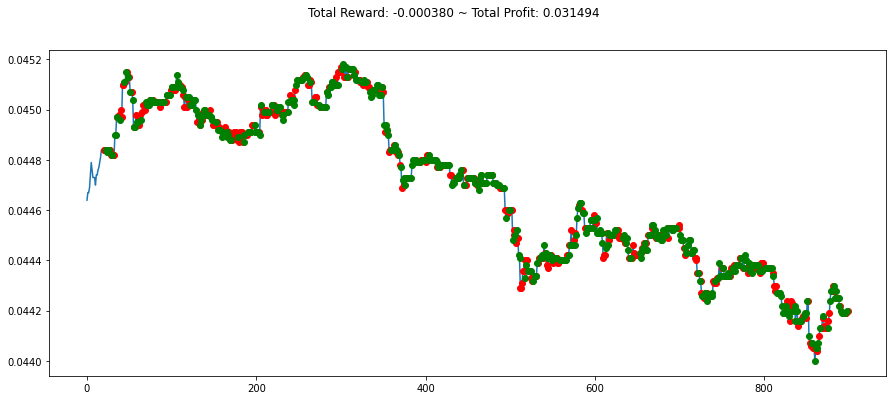

In [60]:



state = env.reset()
while True:
    action = env.action_space.sample()
    n_state ,reward,done,info= env.step(action)
    if done:
        print('info',info)
        break
plt.figure(figsize = (15,6))
plt.cla()
env.render_all()
plt.show()

Build env and train

In [61]:



env_maker = lambda:gym.make('stocks-v0', df=df ,frame_bound = (50,900000),window_size=50)
env = DummyVecEnv([env_maker])

In [62]:



model = PPO('MlpPolicy',env, verbose=1)
model.learn(total_timesteps=900000)

Using cpu device
-----------------------------
| time/              |      |
|    fps             | 2548 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 1675        |
|    iterations           | 2           |
|    time_elapsed         | 2           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.017416287 |
|    clip_fraction        | 0.00137     |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.689      |
|    explained_variance   | 0.0446      |
|    learning_rate        | 0.0003      |
|    loss                 | -0.0359     |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.000973   |
|    value_loss           | 1.11e-06    |
-----------------------------------------
-----------------

[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


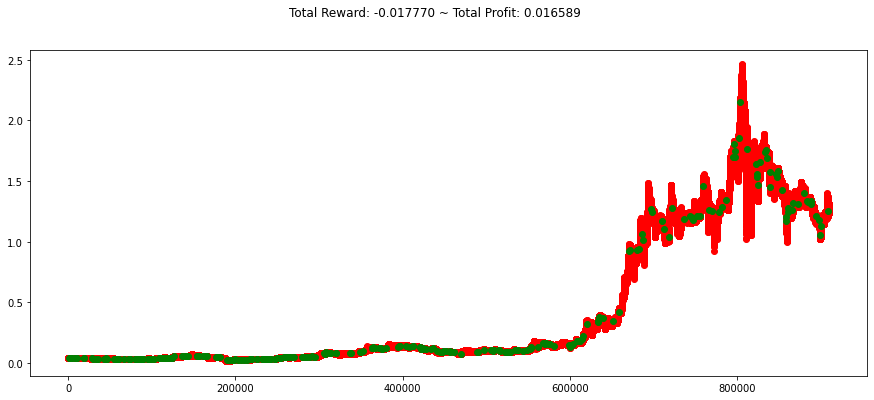

In [ ]:
env= gym.make('stocks-v0', df=df ,frame_bound = (90000,1000000),window_size=50)
obs = env.reset()

while True:
    obs = obs[np.newaxis, ...]
    action, _state = model.predict(obs)
    obs,rewards, done, info = env.step(action)
    print(action)
    if done:
        print('info', info)
        break

plt.figure(figsize = (15,6))
plt.cla()
env.render_all()
plt.show()